In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
from datetime import datetime
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import os
import re
# packages for TEXT PREPROCESSING
import nltk
nltk.download('punkt') # for removing punctuation
from collections import Counter
nltk.download('words')
from nltk.corpus import words
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')
import string
nltk.download('stopwords') # for removing stopwords

from nltk.stem import PorterStemmer
from wordcloud import WordCloud
from matplotlib.colors import LinearSegmentedColormap

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Unzipping corpora/words.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


#

In [ ]:
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


 The dataset was downloaded from **[kaggle](https://www.kaggle.com/datasets/snap/amazon-fine-food-reviews/)**. It consists of reviews of fine foods from amazon.


# Load Dataset

In [ ]:
# Specify the file path
file_path = '/content/gdrive/MyDrive/Text_Mining_ Project/Reviews.csv'


# Read the CSV file into a DataFrame
df = pd.read_csv(file_path, sep=",")

# Convert unix timestamp to date format
df['Time'] = pd.to_datetime(df['Time'], unit='s', utc=True).dt.date
# Convert the 'Time' column to datetime object
df['Time'] = pd.to_datetime(df['Time'])
# Display the first few rows of the DataFrame
df.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,2011-04-27,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,2012-09-07,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,2008-08-18,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,2011-06-13,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,2012-10-21,Great taffy,Great taffy at a great price. There was a wid...


In [ ]:
df.dtypes

Score                                int64
Text                                object
Text_normalized                     object
Tokens                              object
Tokenized_text_without_stopwords    object
Tokens_stemma                       object
Tokens_lemma                        object
dtype: object

In [ ]:
df['Text_lenght']= df['Text'].apply(lambda x: len(str(x).split()))
df['Text_lenght'].describe()

count    393647.000000
mean         79.750858
std          77.160252
min           3.000000
25%          34.000000
50%          57.000000
75%          97.000000
max        3432.000000
Name: Text_lenght, dtype: float64

In [ ]:
df[df['Text_lenght'] == 3]

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,Text_lenght
168550,168551,B0001ES9F8,A33Q5O9WGJUKWN,Seth Goldstein,0,0,5,2006-01-15,good,they are excellent,3
453668,453669,B0001QYYUK,A3S7N11XRRTUU6,Bob,5,14,1,2006-01-03,Not worth it,Not worth it,3


In [ ]:
longest_review= df.loc[df['Text_lenght'].idxmax(), 'Text']

def format_sentence(longest_review):
    print(longest_review.replace('<br /><br />', '.\n'))
format_sentence(longest_review)
#summary: An okay filtered municipal tap water with slight "chalky" aftertaste, but the misleading health claims and hype are quackery!

Fuzzy Wuzzy's Summary:<br />*** Somewhat recommended, with reservations and only lukewarm fuzzies..
Positives:.
+ Not too expensive compared to other bottled water, although it is not cheap either..
Negatives:.
- This bottled water product's labeling, product descriptions, and health claims are misleading..
At first glance, this 1.5-liter bottle of water that I am reviewing looks like another one of the many varieties of bottled water on the market.  There are many kinds of bottled water: "spring water" produced from an underground formation where the groundwater naturally flows up to the Earth's surface, "artesian water" obtained from a well that taps into an underground aquifer, "mineral water" produced from a well or spring that naturally contains trace amounts of minerals that some people consider to provide health benefits, "ground/well water" produced from a well that tapes into an aquifer, "sparkling water" from a spring or well that is naturally carbonated, and "purified water"

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 568454 entries, 0 to 568453
Data columns (total 11 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   Id                      568454 non-null  int64         
 1   ProductId               568454 non-null  object        
 2   UserId                  568454 non-null  object        
 3   ProfileName             568438 non-null  object        
 4   HelpfulnessNumerator    568454 non-null  int64         
 5   HelpfulnessDenominator  568454 non-null  int64         
 6   Score                   568454 non-null  int64         
 7   Time                    568454 non-null  datetime64[ns]
 8   Summary                 568427 non-null  object        
 9   Text                    568454 non-null  object        
 10  Text_lenght             568454 non-null  int64         
dtypes: datetime64[ns](1), int64(5), object(5)
memory usage: 47.7+ MB


# Data cleaning and preprocessing

## Handling duplicated rows and consistency

 In order to make reviews more reliable, we decide to remove all duplicate rows based on the subset consisting of the attributes ['UserId', 'Text', 'Time','ProfileName'].

In [ ]:
original_rows = len(df)
print("original size of the dataframe: ")
original_rows

original size of the dataframe: 


568454

In [ ]:
df = df.drop_duplicates(subset=['UserId', 'Time', 'ProfileName', 'Text'])

now we have to do a consistency check on the columns regarding helpfulness. clearly if the numerator (defined as the amount of users who found the review helpful) is greater than the denominator (defined as the amount of users who indicated whether they found the review helpful or not) the row is not consistent so we have to drop it.

In [ ]:
rows_to_drop = df[df['HelpfulnessNumerator'] > df['HelpfulnessDenominator']]

print("Righe da eliminare:")
print(rows_to_drop[['Id','HelpfulnessNumerator','HelpfulnessDenominator']].to_string(index=False))

Righe da eliminare:
   Id  HelpfulnessNumerator  HelpfulnessDenominator
44737                     3                       2
64422                     3                       1


In [ ]:
df = df.drop(rows_to_drop.index)

We keep only the rows with greatest time, the last one

In [ ]:
df = df.sort_values(by='Time', ascending=False)
df = df.drop_duplicates(subset=['UserId', 'ProfileName', 'Text'], keep='first')

In [ ]:
# some insight
print(f"numbers of Unique Product: {df['ProductId'].nunique()}")
print(f"numbers of Unique Users: {df['UserId'].nunique()}")
print(f"numbers of Reviews: {df['Text'].nunique()}")
print(f"Date of first review: {df['Time'].min()}")
print(f"Date of last review: {df['Time'].max()}")
print(f"Average_Score: {round(df['Score'].mean(),2)}")
print(f"Number of rows removed: {original_rows - len(df)}")
print(f"Percentage of rows dropped: { round(((original_rows - len(df)) / original_rows)*100,2)}%")

numbers of Unique Product: 67578
numbers of Unique Users: 256059
numbers of Reviews: 393577
Date of first review: 1999-10-08 00:00:00
Date of last review: 2012-10-26 00:00:00
Average_Score: 4.18
Number of rows removed: 174809
Percentage of rows dropped: 30.75%


## Handling missing values


In [ ]:
# From a first glance, it seems that there are no missing values
total = df.isnull().sum().sort_values(ascending=False)
percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data

,Total,Percent
ProfileName,11,0.000028
Summary,3,0.000008
Id,0,0.000000
ProductId,0,0.000000
UserId,0,0.000000
HelpfulnessNumerator,0,0.000000
HelpfulnessDenominator,0,0.000000
Score,0,0.000000
Time,0,0.000000
Text,0,0.000000


since we will focus on the Text Column, we don't need to take make any change based on the missing values

## Some insights on data

In the following we display some insight on the data

In [ ]:
# some insight
print(f"numbers of Unique Product: {df['ProductId'].nunique()}")
print(f"numbers of Unique Users: {df['UserId'].nunique()}")
print(f"numbers of Reviews: {df['Text'].nunique()}")
print(f"Date of first review: {df['Time'].min()}")
print(f"Date of last review: {df['Time'].max()}")
print(f"Average_Score: {round(df['Score'].mean(),2)}")
print(f"Number of rows removed: {original_rows - len(df)}")
print(f"Percentage of rows dropped: { round(((original_rows - len(df)) / original_rows)*100,2)}%")

numbers of Unique Product: 67578
numbers of Unique Users: 256059
numbers of Reviews: 393577
Date of first review: 1999-10-08 00:00:00
Date of last review: 2012-10-26 00:00:00
Average_Score: 4.18
Number of rows removed: 174809
Percentage of rows dropped: 30.75%


In [ ]:
print(f"Top five products most reviewed:\n{df.groupby('ProductId').agg(count=('UserId', 'count'), avg_score=('Score', 'mean')).round({'avg_score': 3}).sort_values(by='count', ascending=False).head(5)}\n")

Top five products most reviewed:
            count  avg_score
ProductId                   
B007JFMH8M    912      4.582
B002QWP89S    630      4.594
B003B3OOPA    622      4.741
B001EO5Q64    566      4.746
B0013NUGDE    558      4.310



In [ ]:
df.groupby('ProductId').agg(
    n_reviews=('Text', 'count'),
    avg_score=('Score', 'mean'),
    n_of_different_customer=('UserId', 'nunique'),
)


,n_reviews,avg_score,n_of_different_customer
ProductId,,,
0006641040,37,4.351351,37
141278509X,1,5.000000,1
2734888454,2,3.500000,2
2841233731,1,5.000000,1
7800648702,2,4.000000,2
...,...,...,...
B009SF0TN6,1,5.000000,1
B009SR4OQ2,1,5.000000,1
B009UOFU20,1,1.000000,1


In [ ]:
df01= df[['Id','Time']].set_index('Time')
df02 = df.groupby('Score').agg(count=('Score', 'size'))
df022= df.copy()
df022['Score'] = df022['Score'].astype(str)
score = [
    '1',
    '2',
    '3',
    '4',
    '5'
]

# Create a dictionary to store data for each score and date
score_tables = {}

# Iterate through each score and create a  table
for score_value in score:
    score_df = df022[df022['Score'] == score_value]
    table = score_df.groupby('Time').agg(count=('Score', 'size'))
    score_tables[score_value] = table

fig3 = px.line()
for scori, table in score_tables.items():
    fig3.add_scatter(x=table.index, y=table['count'], name=scori)
# Update layout and labels
fig3.update_layout(
    xaxis_title='Date',
    yaxis_title='Count',
    title='Review Scores Count by Date and Score',
    legend_title_text='Score of Review'
)



fig1 = px.histogram(df01, x=df01.index, y='Id', title='Distribution of Reviews according to the date' )
fig2 = px.histogram(df02, x=df02.index, y='count', title='Review Scores Count by Score', nbins=6 )

fig1.update_layout(height=300, width=500)
fig2.update_layout(height=300, width=500)
fig3.update_layout(height=300, width=500)

fig1.show()
fig2.show()
fig3.show()

In [ ]:
df4= df.copy()
df4['Time'] = pd.to_datetime(df4['Time'])
df4['year']= df4['Time'].dt.year
print(f"count of reviews per year: \n{df4.groupby('year')['ProductId'].count()}\n")

count of reviews per year: 
year
1999         4
2000        17
2001         8
2002        33
2003        99
2004       440
2005      1054
2006      4713
2007     15768
2008     23108
2009     37870
2010     57973
2011    113440
2012    139118
Name: ProductId, dtype: int64



From these plots, we observe an exponential growth of reviews, particulary  5-star reviews since 2007. This signals an imbalance in the distribution of scores, suggesting the need to address this imbalance before proceeding with further analysis.

## Considering only attributes of interest

In [ ]:
# For simplicity we delete not useful columns
df1 = df.drop(['ProductId', 'UserId', 'Time', 'ProfileName', 'Id',
                 'HelpfulnessNumerator', 'Summary', 'HelpfulnessDenominator'],
                axis = 1)

In [ ]:
df1

,Score,Text,Text_lenght
491765,1,Nespresso makes GREAT coffee and GREAT machine...,46
495126,5,"I love these ginger candy, tastes like ginger ...",44
417643,5,This product is a great alternative to peanut ...,56
287727,5,This is the best coffee ever! Wish I could ord...,45
210947,5,You can taste the butter. The peanuts are fre...,38
...,...,...,...
451854,5,Beetlejuice is an excellent and funny movie. K...,43
230284,5,"A twist of rumplestiskin captured on film, sta...",36
451855,5,Beetlejuice is a well written movie ..... ever...,29
150500,5,I can remember seeing the show when it aired o...,78


# Text Pre-processing

In [ ]:
#we create a copy
df2= df1.copy()

In [ ]:
! pip install contractions

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.9/289.9 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.8/110.8 kB 13.6 MB/s eta 0:00:00


In [ ]:
import contractions

In [ ]:
# Get an english dictionaire
english_dict = set(words.words())

In [ ]:
# Check if "yummy" is in the English dictionary
if "yummy" in english_dict:
    print("The word 'yummy' is in the English dictionary.")
else:
    print("The word 'yummy' is not in the English dictionary.")

The word 'yummy' is in the English dictionary.


We define a function to adjust the spelling of some words

In [ ]:
def adjust_words(phrase):

    phrase = re.sub(r"Wal-Mart", "Walmart", phrase)
    phrase = re.sub(r"U\.S\.A\.?|U\.S\.|US\.?", "USA", phrase)

    return phrase

## Text normalization and tokenization
We apply a fuction with various normalization steps and then we split the normalized text into a list of tokens

In [ ]:
# Define a function to normalize text
def normalize_text(text):
    # Convert text to lowercase
    text = text.lower()
    # Remove HTML tags
    text = re.sub("<.*?>", "", text).strip()
    # Remove numerical digits
    text = re.sub(r'\d+', '', text)
    # Remove URLs and links
    text = re.sub(r'http\S+|www\.[A-Za-z]*\.com', ' ', text)
    # Use contractions.fix to handle contractions
    text = contractions.fix(text)
    #Expansion of contractions
    text= adjust_words(text)
    # Remove special characters and punctuations, leaving only alphabetic characters
    text = re.sub("[^a-zA-Z]+", ' ', text).strip() #removes leading and trailing white space

    return text

# Apply the normalization function to the 'Text' column and store the result in 'Text_normalized'
df2['Text_normalized'] = df2['Text'].apply(normalize_text)
df2['Tokens'] = df2['Text_normalized'].apply(nltk.word_tokenize)

## Stop-words removal

 We  decide to include in the list of stop_words  the set of word ['would', 'amazon', 'product']  due to their high frequency, while excluding "not" since we need to distinguish negative from positive reviews

In [ ]:
stop_words = set(nltk.corpus.stopwords.words('english'))

In [ ]:
sorted_stop_words = sorted(stop_words)
print(sorted_stop_words)

['a', 'about', 'above', 'after', 'again', 'against', 'ain', 'all', 'am', 'an', 'and', 'any', 'are', 'aren', "aren't", 'as', 'at', 'be', 'because', 'been', 'before', 'being', 'below', 'between', 'both', 'but', 'by', 'can', 'couldn', "couldn't", 'd', 'did', 'didn', "didn't", 'do', 'does', 'doesn', "doesn't", 'doing', 'don', "don't", 'down', 'during', 'each', 'few', 'for', 'from', 'further', 'had', 'hadn', "hadn't", 'has', 'hasn', "hasn't", 'have', 'haven', "haven't", 'having', 'he', 'her', 'here', 'hers', 'herself', 'him', 'himself', 'his', 'how', 'i', 'if', 'in', 'into', 'is', 'isn', "isn't", 'it', "it's", 'its', 'itself', 'just', 'll', 'm', 'ma', 'me', 'mightn', "mightn't", 'more', 'most', 'mustn', "mustn't", 'my', 'myself', 'needn', "needn't", 'no', 'nor', 'not', 'now', 'o', 'of', 'off', 'on', 'once', 'only', 'or', 'other', 'our', 'ours', 'ourselves', 'out', 'over', 'own', 're', 's', 'same', 'shan', "shan't", 'she', "she's", 'should', "should've", 'shouldn', "shouldn't", 'so', 'some',

In [ ]:
# we decided to exclude not from the list of stop_words
stop_words.update(['would', 'amazon', 'product'])
stop_words.remove('not')

# Define a function to remove stop words from a list of tokens
def remove_stop_words(tokens):
    return [token for token in tokens if token not in stop_words]

# Apply the remove_stop_words function to the 'Tokens' column
df2['Tokenized_text_without_stopwords'] = df2['Tokens'].apply(remove_stop_words)


We define a function to adjust the spelling of some words that we believe will improve the information content of the reviews during the later stages of the NLP tasks.

In [ ]:
def adjust_words(tokens):
    replacements = {
        r"waaaay": "way",
        r"loooove": "love",
        r"wayyyy": "way",
        r"looove": "love",
        r"waaay": "way",
        r"looooove": "love",
        r"loooong": "long",
        r"noooo": "no",
        r"wayyy": "way",
        r"looooong": "long",
        r"waaaaay": "way",
        r"looooves": "love",
        r"looong": "long",
        r"deeeelicious": "delicious",
        r"goooooood": "good",
        r"loooooove": "love",
        r"wayyyyy": "way",
        r"realllly": "really",
        r"loveeeee": "love",
        r"goooddd": "good",
        r"goooood": "good",
        r"goood": "good",
        r"goooood": "good",
        r"gooood": "good",
        r"suuupppper": "super",
        r"ewww": "eww",  # it is an informal expression used to convey disgust or distaste
        r"ewwww": "eww",

        r"grrr": "grr", #  it is typically associated with the expression of frustration, anger, or annoyance
        r"grrrr": "grr",

        r"yummm": "yummy", # it describes  something that is delicious, tasty, or pleasing
        r"yummmm": "yummy",
        r"yummmmm": "yummy",
        r"yummmmmm": "yummy",
        r"yummmmmmm": "yummy",


    }

        # Replace tokens based on the dictionary
    adjusted_tokens = [replacements.get(token, token) for token in tokens]

    return adjusted_tokens

# Apply the adjust_words function to the 'Tokens' column
df2['Tokenized_text_without_stopwords'] = df2['Tokenized_text_without_stopwords'].apply(adjust_words)

In [ ]:
df2

,Score,Text,Text_normalized,Tokens,Tokenized_text_without_stopwords
491765,1,Nespresso makes GREAT coffee and GREAT machine...,nespresso makes great coffee and great machine...,"[nespresso, makes, great, coffee, and, great, ...","[nespresso, makes, great, coffee, great, machi..."
495126,5,"I love these ginger candy, tastes like ginger ...",i love these ginger candy tastes like ginger n...,"[i, love, these, ginger, candy, tastes, like, ...","[love, ginger, candy, tastes, like, ginger, no..."
417643,5,This product is a great alternative to peanut ...,this product is a great alternative to peanut ...,"[this, product, is, a, great, alternative, to,...","[great, alternative, peanut, butter, butter, l..."
287727,5,This is the best coffee ever! Wish I could ord...,this is the best coffee ever wish i could orde...,"[this, is, the, best, coffee, ever, wish, i, c...","[best, coffee, ever, wish, could, order, box, ..."
210947,5,You can taste the butter. The peanuts are fre...,you can taste the butter the peanuts are fresh...,"[you, can, taste, the, butter, the, peanuts, a...","[taste, butter, peanuts, fresh, piece, see, pe..."
...,...,...,...,...,...
451854,5,Beetlejuice is an excellent and funny movie. K...,beetlejuice is an excellent and funny movie ke...,"[beetlejuice, is, an, excellent, and, funny, m...","[beetlejuice, excellent, funny, movie, keaton,..."
230284,5,"A twist of rumplestiskin captured on film, sta...",a twist of rumplestiskin captured on film star...,"[a, twist, of, rumplestiskin, captured, on, fi...","[twist, rumplestiskin, captured, film, starrin..."
451855,5,Beetlejuice is a well written movie ..... ever...,beetlejuice is a well written movie everything...,"[beetlejuice, is, a, well, written, movie, eve...","[beetlejuice, well, written, movie, everything..."
150500,5,I can remember seeing the show when it aired o...,i can remember seeing the show when it aired o...,"[i, can, remember, seeing, the, show, when, it...","[remember, seeing, show, aired, television, ye..."


In [ ]:
indices = [136463, 516194, 136343, 119326, 203688, 86837]

for i in indices:
    print("Tokens #",df2['Tokens'][i])
    print("Tokenized_text_without_stopwords: ", df2['Tokenized_text_without_stopwords'][i])
    print()

Tokens # ['who', 'wants', 'to', 'drink', 'coffee', 'grounds', 'ewww', 'these', 'are', 'faulty', 'do', 'not', 'waste', 'your', 'money', 'unless', 'you', 'need', 'grounds', 'for', 'composting']
Tokenized_text_without_stopwords:  ['wants', 'drink', 'coffee', 'grounds', 'eww', 'faulty', 'not', 'waste', 'money', 'unless', 'need', 'grounds', 'composting']

Tokens # ['now', 'i', 'love', 'this', 'coffee', 'even', 'more', 'growing', 'from', 'a', 'pack', 'to', 'a', 'pack', 'yesss', 'more', 'of', 'my', 'mornings', 'just', 'got', 'extra', 'palatable']
Tokenized_text_without_stopwords:  ['love', 'coffee', 'even', 'growing', 'pack', 'pack', 'yesss', 'mornings', 'got', 'extra', 'palatable']

Tokens # ['the', 'corner', 'donut', 'shop', 'is', 'my', 'new', 'go', 'to', 'coffee', 'my', 'house', 'smells', 'amazing', 'when', 'brewed', 'and', 'it', 'is', 'yummy', 'mmmmm', 'donuts']
Tokenized_text_without_stopwords:  ['corner', 'donut', 'shop', 'new', 'go', 'coffee', 'house', 'smells', 'amazing', 'brewed', 'y

## Spelling corrections of words

The objective is to correct words with more than three consecutive identical letters. Given that English words typically have a maximum of two repeated letters, the normalize_word function is employed to reduce occurrences to two.

After identifying words with repeated consecutive characters, it is checked whether the reduced words are valid English words present in the NLTK English dictionary. If a correct word is found, the original value is replaced with the correct word. Otherwise we examine the frequency below: if it is greater than 15, the word is manually corrected using the function defined before.

In [ ]:
# Initialize a Counter to count the frequency
word_frequency = Counter()

# Loop through the tokenized text and count the frequency of misspelled words
for token_list in df2['Tokenized_text_without_stopwords']:
    for word in token_list:
        if (match := re.search(r'\b\w*(\w)\1{2,}\w*\b', word)):
            # Increment the count for the misspelled word
            word_frequency[word] += 1

# Display the frequency of each misspelled word
sorted_word_frequency = sorted(word_frequency.items(), key=lambda x: x[1], reverse=True)
for word, count in sorted_word_frequency:
    print(f"Word: {word}, Frequency: {count}")

Word: soooo, Frequency: 804
Word: sooo, Frequency: 742
Word: sooooo, Frequency: 451
Word: mmmm, Frequency: 255
Word: mmm, Frequency: 246
Word: mmmmm, Frequency: 225
Word: hmmm, Frequency: 210
Word: soooooo, Frequency: 196
Word: mmmmmm, Frequency: 132
Word: sooooooo, Frequency: 83
Word: hmmmm, Frequency: 75
Word: ahhh, Frequency: 62
Word: mmmmmmm, Frequency: 62
Word: ummm, Frequency: 60
Word: soooooooo, Frequency: 48
Word: aaa, Frequency: 42
Word: mmmmmmmm, Frequency: 39
Word: www, Frequency: 35
Word: xxx, Frequency: 35
Word: yummmy, Frequency: 34
Word: gooood, Frequency: 33
Word: oooh, Frequency: 31
Word: ahhhh, Frequency: 30
Word: hmmmmm, Frequency: 28
Word: tooo, Frequency: 27
Word: bbb, Frequency: 27
Word: sooooooooo, Frequency: 27
Word: toooo, Frequency: 27
Word: ohhh, Frequency: 24
Word: iii, Frequency: 23
Word: ummmm, Frequency: 21
Word: soooooooooo, Frequency: 19
Word: ooooh, Frequency: 19
Word: coffeee, Frequency: 19
Word: mmmmmmmmm, Frequency: 18
Word: mmmmmmmmmm, Frequency: 1

In [ ]:
# Identify wrong words with repeated consecutive characters
wrong_words = {(match.group(0), re.sub(r'(\w)\1{2,}', r'\1\1', match.group(0))) #reduce to 2 repeated characters if there are 3 or more repeated characters
               for token_list in df2['Tokenized_text_without_stopwords']
               for word in token_list
               if (match := re.search(r'\b\w*(\w)\1{2,}\w*\b', word))}

# Iterate over the wrong_words set and replace the second element with a blank space if not in the dictionary
for idx, (wrong_word, correct_word) in enumerate(wrong_words):
    if correct_word not in english_dict:
        wrong_words.remove((wrong_word, correct_word))
        wrong_words.add((wrong_word, ''))

In [ ]:
#print first 50 values
count = 0
for element in wrong_words:
    print(element)
    count += 1
    if count == 50:
        break

('crazzzzzyyyyy', '')
('unsweeetened', 'unsweetened')
('biiig', '')
('mooooooooooosssssseyyyyy', '')
('decaffflavored', '')
('isss', '')
('meeee', '')
('skilllet', 'skillet')
('ooooppppsss', '')
('uhhhh', '')
('verrrrrry', '')
('bzzz', '')
('tooooo', 'too')
('sooooooooo', '')
('deeeeeeeelicious', '')
('xxxs', '')
('whaaat', '')
('moooo', 'moo')
('farrrrrrrr', '')
('lovesss', '')
('boooo', 'boo')
('ssssssoooooo', '')
('botttle', 'bottle')
('asssmaypo', '')
('ehhhhhh', '')
('hawwww', '')
('nooooo', '')
('errrk', '')
('nooo', '')
('oqobbaxaacmkmmmftbyis', '')
('brownieeee', '')
('goooooooooo', 'goo')
('ooomph', '')
('sooooooooooooooo', '')
('yeeeesss', '')
('sooonfuls', '')
('geeesh', '')
('faaaaaaavorite', '')
('appple', 'apple')
('eeewwwwwww', '')
('sweeetener', 'sweetener')
('everrrrrr', '')
('squeeezing', 'squeezing')
('booom', 'boom')
('brrrrr', '')
('thankfullly', 'thankfully')
('suuuper', '')
('uggg', '')
('yuuummmmm', '')
('grasssaver', '')


In [ ]:
def process_tokenized_words(tokenized_words, wrong_words):
    for wrong_word, correct_word in wrong_words:
        # If correct_word is not empty, replace wrong_word with correct_word
        if correct_word != '':
            tokenized_words = [correct_word if word == wrong_word else word for word in tokenized_words]
        # If correct_word is empty, remove wrong_word from tokenized_words
        elif wrong_word in tokenized_words:
            tokenized_words.remove(wrong_word)

    return [word for word in tokenized_words if word]

# Apply the function to the 'tokenized_words' column of df4
df2['Tokenized_text_without_stopwords'] = df2['Tokenized_text_without_stopwords'].apply(lambda x: process_tokenized_words(x, wrong_words))

In [ ]:
indices = [136463, 516194, 136343, 119326, 203688, 86837]

for i in indices:
    print("Tokens #",df2['Tokens'][i])
    print("Tokenized_text_without_stopwords: ", df2['Tokenized_text_without_stopwords'][i])
    print()

## Stemmatization and lemmatization

In a newly created column named 'Tokens_stemma' and 'Tokens_lemma'  we perform stemmatization and lemmatization on the 'Tokenized_text_without_stopwords' column.


In [ ]:
ps = PorterStemmer()
def stemma_text(tokens):
  stemmed_tokens = [ps.stem(token) for token in tokens]
  return stemmed_tokens
 # Apply the lemma_text function to the 'Tokenized_text_without_stopwords' column
df2['Tokens_stemma'] = df2['Tokenized_text_without_stopwords'].apply(stemma_text)


In [ ]:
# Initialize WordNet Lemmatizer
wordnet_lemmatizer = WordNetLemmatizer()

def lemma_text(tokens):
    lemma_text = [wordnet_lemmatizer.lemmatize(word) for word in tokens]
    return lemma_text

# Apply the lemma_text function to the 'Tokenized_text_without_stopwords' column
df2['Tokens_lemma'] = df2['Tokenized_text_without_stopwords'].apply(lemma_text)

In [ ]:
df2

In [ ]:
# Initialize a Counter to count the frequency
word_frequency = Counter()

# Loop through the tokenized text and count the frequency of words
for token_list in df2['Tokens_lemma']:
    for word in token_list:
        word_frequency[word] += 1

# Print the most common words and their frequencies
print("Top 200 most common words:")
for word, frequency in word_frequency.most_common(200):
    print(f"{word}: {frequency}")



In [ ]:

df2.to_csv('/content/gdrive/MyDrive/Text_Mining_ Project/preprocessed_df.csv', index=False)


# Violin plots and WordClouds

In [ ]:
# Specify the file path
file_path = '/content/gdrive/MyDrive/Text_Mining_ Project/files_csv/preprocessed_df.csv'


# Read the CSV file into a DataFrame
df = pd.read_csv(file_path, sep=",")
df

,Score,Text,Text_normalized,Tokens,Tokenized_text_without_stopwords,Tokens_stemma,Tokens_lemma
0,3,This was very good for the most part. I like t...,this was very good for the most part i like to...,"['this', 'was', 'very', 'good', 'for', 'the', ...","['good', 'part', 'like', 'drink', 'chilly', 'm...","['good', 'part', 'like', 'drink', 'chilli', 'm...","['good', 'part', 'like', 'drink', 'chilly', 'm..."
1,5,This honey made from blueberry blossoms has a ...,this honey made from blueberry blossoms has a ...,"['this', 'honey', 'made', 'from', 'blueberry',...","['honey', 'made', 'blueberry', 'blossoms', 'mi...","['honey', 'made', 'blueberri', 'blossom', 'mil...","['honey', 'made', 'blueberry', 'blossom', 'mil..."
2,5,"I'm a lousy cook and I know it. However, when...",i am a lousy cook and i know it however when m...,"['i', 'am', 'a', 'lousy', 'cook', 'and', 'i', ...","['lousy', 'cook', 'know', 'however', 'kids', '...","['lousi', 'cook', 'know', 'howev', 'kid', 'gri...","['lousy', 'cook', 'know', 'however', 'kid', 'g..."
3,5,Anything this company makes is worthwhile eati...,anything this company makes is worthwhile eati...,"['anything', 'this', 'company', 'makes', 'is',...","['anything', 'company', 'makes', 'worthwhile',...","['anyth', 'compani', 'make', 'worthwhil', 'eat...","['anything', 'company', 'make', 'worthwhile', ..."
4,5,Very pleased with the quality of the espresso....,very pleased with the quality of the espresso ...,"['very', 'pleased', 'with', 'the', 'quality', ...","['pleased', 'quality', 'espresso', 'pods', 'st...","['pleas', 'qualiti', 'espresso', 'pod', 'sturd...","['pleased', 'quality', 'espresso', 'pod', 'stu..."
...,...,...,...,...,...,...,...
393642,5,Beetlejuice is an excellent and funny movie. K...,beetlejuice is an excellent and funny movie ke...,"['beetlejuice', 'is', 'an', 'excellent', 'and'...","['beetlejuice', 'excellent', 'funny', 'movie',...","['beetlejuic', 'excel', 'funni', 'movi', 'keat...","['beetlejuice', 'excellent', 'funny', 'movie',..."
393643,5,"A twist of rumplestiskin captured on film, sta...",a twist of rumplestiskin captured on film star...,"['a', 'twist', 'of', 'rumplestiskin', 'capture...","['twist', 'rumplestiskin', 'captured', 'film',...","['twist', 'rumplestiskin', 'captur', 'film', '...","['twist', 'rumplestiskin', 'captured', 'film',..."
393644,5,Beetlejuice is a well written movie ..... ever...,beetlejuice is a well written movie everything...,"['beetlejuice', 'is', 'a', 'well', 'written', ...","['beetlejuice', 'well', 'written', 'movie', 'e...","['beetlejuic', 'well', 'written', 'movi', 'eve...","['beetlejuice', 'well', 'written', 'movie', 'e..."
393645,5,I can remember seeing the show when it aired o...,i can remember seeing the show when it aired o...,"['i', 'can', 'remember', 'seeing', 'the', 'sho...","['remember', 'seeing', 'show', 'aired', 'telev...","['rememb', 'see', 'show', 'air', 'televis', 'y...","['remember', 'seeing', 'show', 'aired', 'telev..."


In [ ]:
# Define the colors for each score
score_colors = {0:'#9e81b1', 1: '#f77189', 2: '#9e81b1', 3: '#5894c0', 4: '#5cb772', 5: '#f1a54d'}

We display violin plots representing, for each value of the 'Score' parameter, the distribution of the number of words present in the reviews associated with that score. To highlight the distribution and, in particular, the differences in distributions for different score values, we chose to filter out reviews by excluding the few outlier reviews with a very high and abnormal number of words, specifically those beyond the 99.9th percentile

In [ ]:
quantile_999 = df['Text'].apply(lambda x: len(x.split())).quantile(0.999)
df_filtered = df[df['Text'].apply(lambda x: len(x.split())) <= quantile_999]

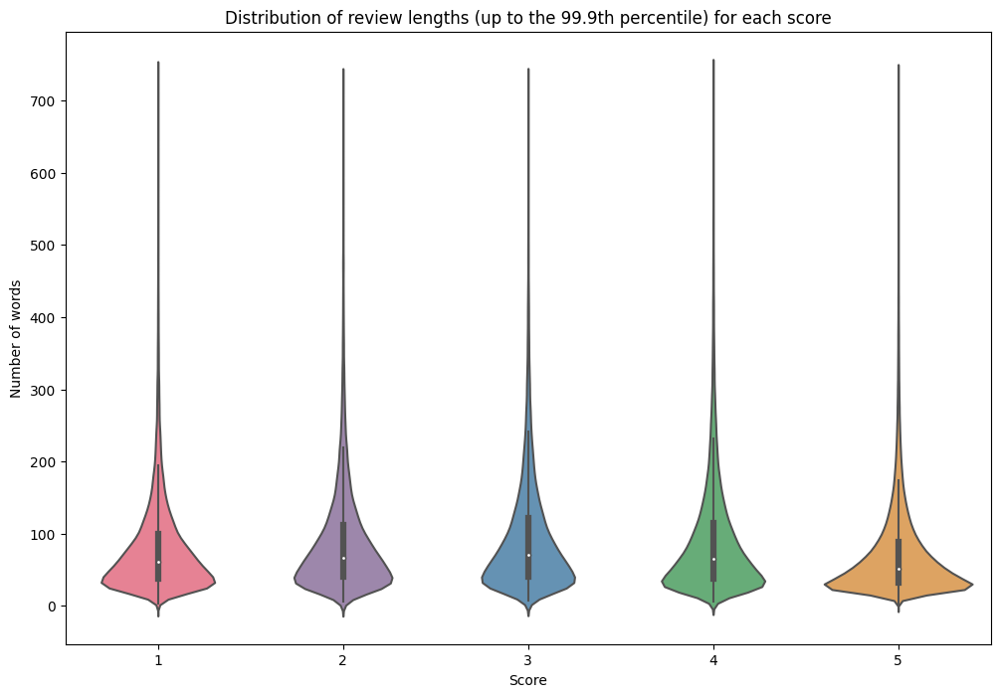

In [ ]:
scores = sorted(df_filtered['Score'].unique())
palette = [score_colors[score] for score in scores]
plt.figure(figsize=(12, 8))
sns.violinplot(x='Score', y=df_filtered['Text'].apply(lambda x: len(x.split())), data=df_filtered, palette=palette, order=scores)
plt.title('Distribution of review lengths (up to the 99.9th percentile) for each score')
plt.xlabel('Score')
plt.ylabel('Number of words')
plt.show()

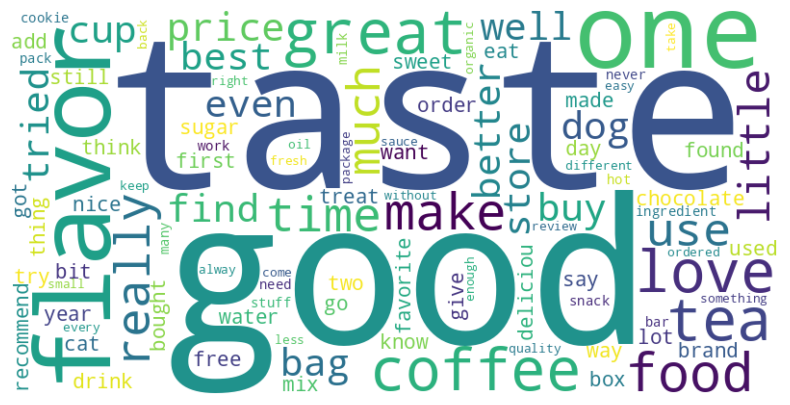

In [ ]:
df['Tokenized_text_without_stopwords'] = df['Tokenized_text_without_stopwords'].str.replace("'", '')
text = ' '.join(df['Tokenized_text_without_stopwords'])

wordcloud = WordCloud(width=800, height=400, background_color='white', collocations=False, max_words=100).generate(text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [ ]:
def get_color_map(cls):
    if cls == 1:
        return LinearSegmentedColormap.from_list('color_map_1', ['#1F497D', '#603C5B', '#006D77'])
    elif cls == 5:
        return LinearSegmentedColormap.from_list('color_map_5', ['#FF4500', '#FFA500', '#00FF00'])
    else:
        return 'viridis'

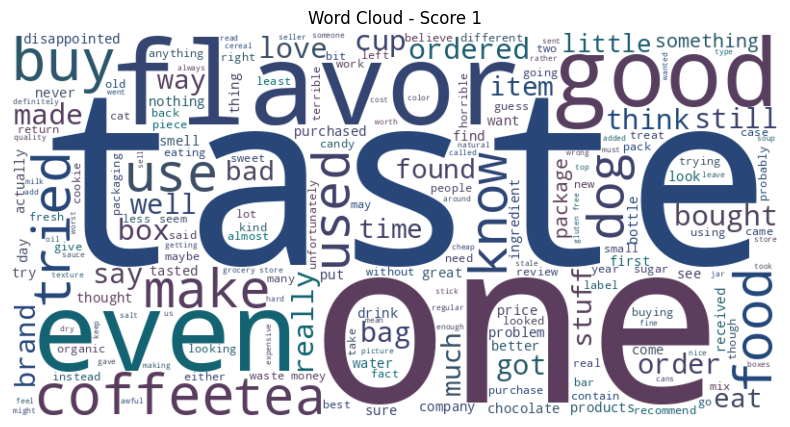

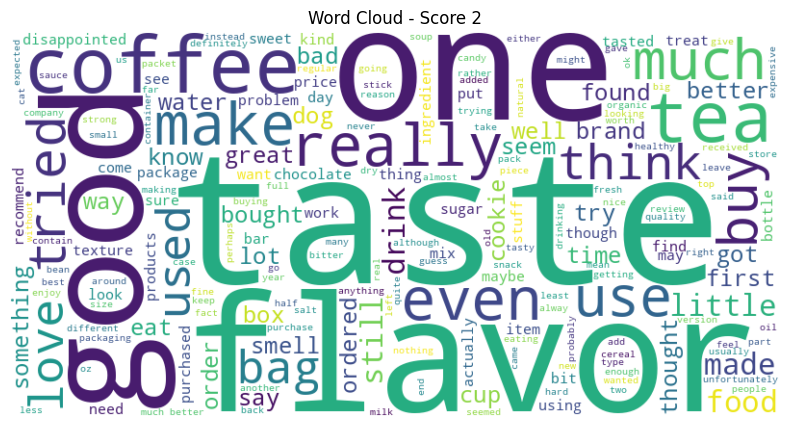

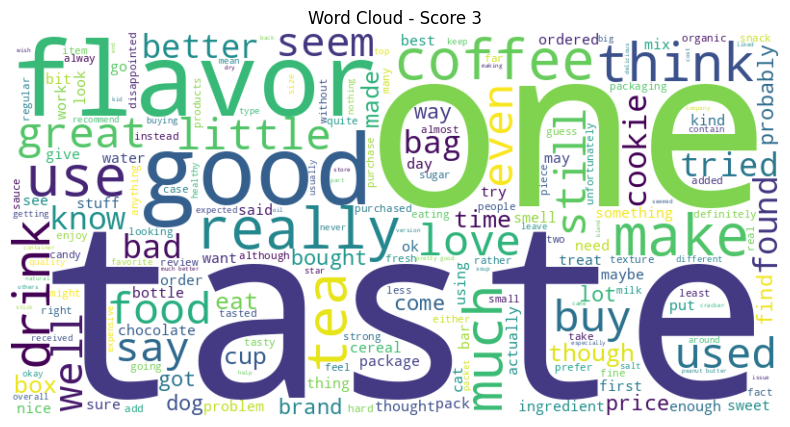

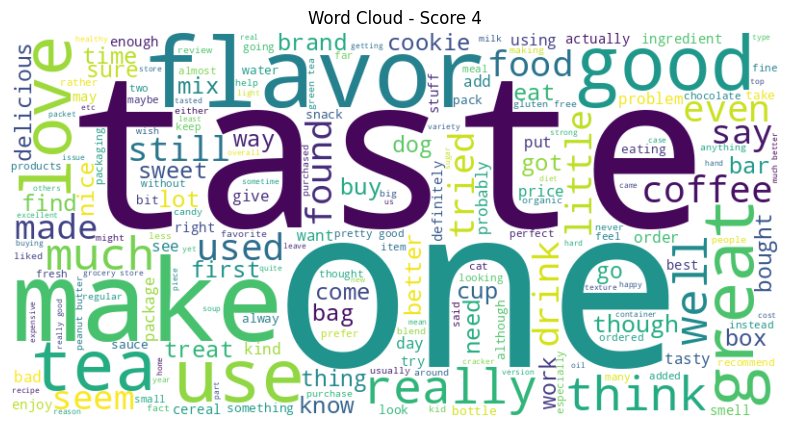

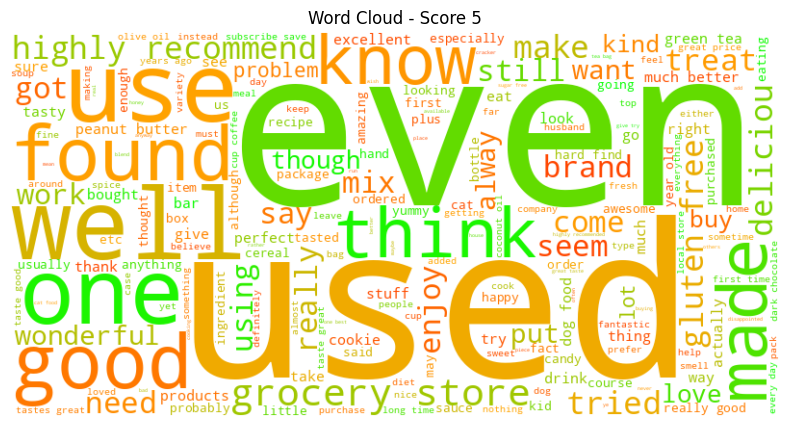

In [ ]:
classes = sorted(df['Score'].unique())

for cls in classes:
    # select only reviews of current class
    subset = df[df['Score'] == cls]

    # join all reviews of a class
    df['Tokenized_text_without_stopwords'] = df['Tokenized_text_without_stopwords'].str.replace("'", '')
    text = ' '.join(subset['Tokenized_text_without_stopwords'])

    # create word cloud
    color_map = get_color_map(cls)
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap=color_map).generate(text)

    # Visualize word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud - Score {cls}')
    plt.axis('off')
    plt.show()

# Balancing/Sampling

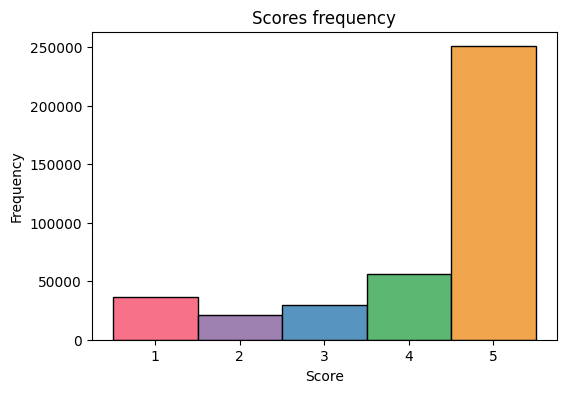

In [ ]:
# Count the number of occurence for each score
score_counts = df['Score'].value_counts().sort_index()

# Plot the histogram
plt.figure(figsize=(6, 4))

# Iterate over each score and plot a bar with the corresponding color
for score, count in score_counts.items():
    plt.bar(str(score), count, color=score_colors[score], edgecolor='black', width=1)

# Customize the plot
plt.xlabel('Score')
plt.ylabel('Frequency')
plt.title('Scores frequency')
plt.show()

In [ ]:
num_reviews_score2 = df['Score'].value_counts().get(2, 0)
num_reviews_score3 = df['Score'].value_counts().get(3, 0)
print("Numero di recensioni con score 2:", num_reviews_score2)
print("Numero di recensioni con score 3:", num_reviews_score3)

Numero di recensioni con score 2: 20796
Numero di recensioni con score 3: 29757


### Multiclass sampling

In [ ]:
desired_count_all_scores = num_reviews_score2 #we set it equal to the number of reviews with score 2

In [ ]:
downsampled_df_1 = pd.concat([
    df[df['Score'] == 1].sample(n=desired_count_all_scores, replace=True),
    df[df['Score'] == 2].sample(n=desired_count_all_scores, replace=True),
    df[df['Score'] == 3].sample(n=desired_count_all_scores, replace=True),
    df[df['Score'] == 4].sample(n=desired_count_all_scores, replace=True),
    df[df['Score'] == 5].sample(n=desired_count_all_scores, replace=True),
], ignore_index=True)

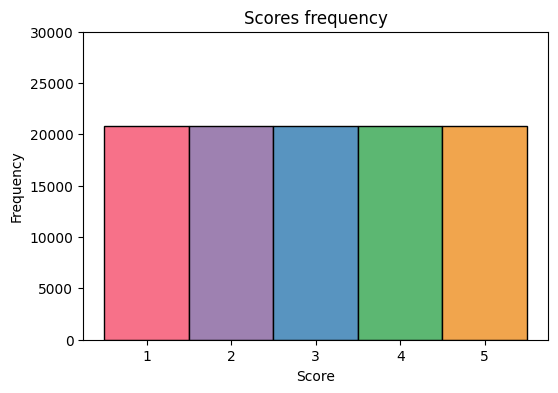

In [ ]:
# Count the number of occurence for each score
score_counts =downsampled_df_1['Score'].value_counts().sort_index()
# Plot the histogram
plt.figure(figsize=(6, 4))

# Iterate over each score and plot a bar with the corresponding color
for score, count in score_counts.items():
    plt.bar(str(score), count, color=score_colors[score], edgecolor='black', width=1)
plt.ylim(0, 30000)

plt.xlabel('Score')
plt.ylabel('Frequency')
plt.title('Scores frequency')

plt.show()

In [ ]:
downsampled_df_1 = downsampled_df_1[['Tokens_lemma', 'Score']]

In [ ]:

downsampled_df_1 .to_csv('/content/gdrive/MyDrive/Text_Mining_ Project/multiclasse_df.csv', index=False)


### Binary sampling

In [ ]:
balanced_df = df[df['Score'] != 3].copy()  #remove score=3
desired_count_all_scores = num_reviews_score2 #we set it equal to the number of reviews with score 2

In [ ]:
downsampled_df_2 = pd.concat([
    balanced_df[balanced_df['Score'] == 1].sample(n=desired_count_all_scores, replace=True),
    balanced_df[balanced_df['Score'] == 2].sample(n=desired_count_all_scores, replace=True),
    balanced_df[balanced_df['Score'] == 4].sample(n=desired_count_all_scores, replace=True),
    balanced_df[balanced_df['Score'] == 5].sample(n=desired_count_all_scores, replace=True),
], ignore_index=True)

In [ ]:
#  Convert score column to binary values
downsampled_df_2['Score'] = downsampled_df_2['Score'].apply(lambda x: 0 if x in [1, 2] else 1)

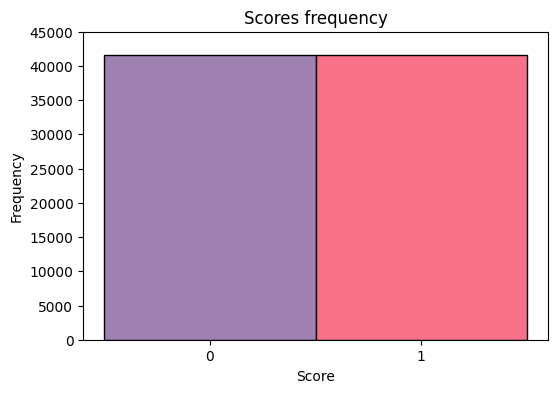

In [ ]:
# Count the number of occurence for each score
score_counts = downsampled_df_2['Score'].value_counts().sort_index()
# Plot the histogram
plt.figure(figsize=(6, 4))

# Iterate over each score and plot a bar with the corresponding color
for score, count in score_counts.items():
    plt.bar(str(score), count, color=score_colors[score], edgecolor='black', width=1)
plt.ylim(0, 45000)

plt.xlabel('Score')
plt.ylabel('Frequency')
plt.title('Scores frequency')

plt.show()

In [ ]:
downsampled_df_2 = downsampled_df_2[['Tokens_lemma', 'Score']]

In [ ]:

downsampled_df_2.to_csv('/content/gdrive/MyDrive/Text_Mining_ Project/binaria_df.csv', index=False)
